In [1]:
%scala 
val driver = "org.postgresql.Driver"
val jdbcUsername = "data_sci"
val jdbcPassword = "dataSci4lyf"



val jdbcUrl = "jdbc:postgresql://cpdb-databricks.cgod7egsd6vr.us-east-2.rds.amazonaws.com/cpdb"

import java.util.Properties
val connectionProperties = new Properties()

connectionProperties.put("user", jdbcUsername)
connectionProperties.put("password", jdbcPassword)
connectionProperties.setProperty("Driver", driver)

driver: String = org.postgresql.Driver
jdbcUsername: String = data_sci
jdbcPassword: String = dataSci4lyf
jdbcUrl: String = jdbc:postgresql://cpdb-databricks.cgod7egsd6vr.us-east-2.rds.amazonaws.com/cpdb
import java.util.Properties
connectionProperties: java.util.Properties = {user=data_sci, password=dataSci4lyf, Driver=org.postgresql.Driver}
res12: Object = null

In [2]:
%scala
val data_officerallegation_query = "(select * from data_officerallegation) data_officerallegation"
val data_officerallegation = spark.read.jdbc(url=jdbcUrl, table=data_officerallegation_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_officerallegation.createOrReplaceTempView("data_officerallegation")

data_officerallegation_query: String = (select * from data_officerallegation) data_officerallegation
data_officerallegation: org.apache.spark.sql.DataFrame = [id: int, start_date: date ... 11 more fields]

In [3]:
%scala
val data_allegationcategory_query = "(select * from data_allegationcategory) data_allegationcategory"
val data_allegationcategory = spark.read.jdbc(url=jdbcUrl, table=data_allegationcategory_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_allegationcategory.createOrReplaceTempView("data_allegationcategory")

data_allegationcategory_query: String = (select * from data_allegationcategory) data_allegationcategory
data_allegationcategory: org.apache.spark.sql.DataFrame = [id: int, category_code: string ... 4 more fields]

In [4]:
%scala
val data_officer_query = "(select * from data_officer) data_officer"
val data_officer = spark.read.jdbc(url=jdbcUrl, table=data_officer_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_officer.createOrReplaceTempView("data_officer")


data_officer_query: String = (select * from data_officer) data_officer
data_officer: org.apache.spark.sql.DataFrame = [id: int, gender: string ... 17 more fields]

In [5]:
%scala
val data_allegation_query = "(select * from data_allegation) data_allegation"
val data_allegation = spark.read.jdbc(url=jdbcUrl, table=data_allegation_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_allegation.createOrReplaceTempView("data_allegation")

data_allegation_query: String = (select * from data_allegation) data_allegation
data_allegation: org.apache.spark.sql.DataFrame = [id: int, crid: string ... 11 more fields]

In [6]:
%sql

drop table if exists allegation_category;
create table allegation_category as
select officer_id, allegation_category_id, data_allegationcategory.category, data_officerallegation.allegation_id, data_allegation.incident_date
from data_officerallegation
INNER JOIN data_allegationcategory ON data_allegationcategory.id = data_officerallegation.allegation_category_id
INNER JOIN data_allegation ON data_allegation.id = data_officerallegation.allegation_id
WHERE rand() <= 0.03;


drop table if exists category_co_accusals;
create table category_co_accusals as
select tb1.officer_id as id1, tb2.officer_id as id2, tb1.allegation_category_id, tb1.category, tb1.incident_date 
from allegation_category as tb1
INNER JOIN allegation_category as tb2
ON tb1.officer_id != tb2.officer_id and tb1.allegation_category_id = tb2.allegation_category_id

In [7]:
%sql
select * from category_co_accusals

id1,id2,allegation_category_id,category,incident_date
8165,22464,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,16961,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,29812,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,26217,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,29663,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,29800,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,9812,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,2788,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,13649,88,Lockup Procedures,2000-01-13T00:00:00.000+0000
8165,7404,88,Lockup Procedures,2000-01-13T00:00:00.000+0000


In [8]:
%sql
drop table if exists category_co_accusals_limit;
create table category_co_accusals_limit as
select * from category_co_accusals
where id1 in 
(
  select officer_id from data_officerallegation
  group by officer_id
  order by count(id) DESC
  limit 100
)
or
id2 in 
(
	select officer_id from data_officerallegation
	group by officer_id
	order by count(id) DESC
	limit 100
)

In [9]:
from pyspark.sql.functions import *
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time

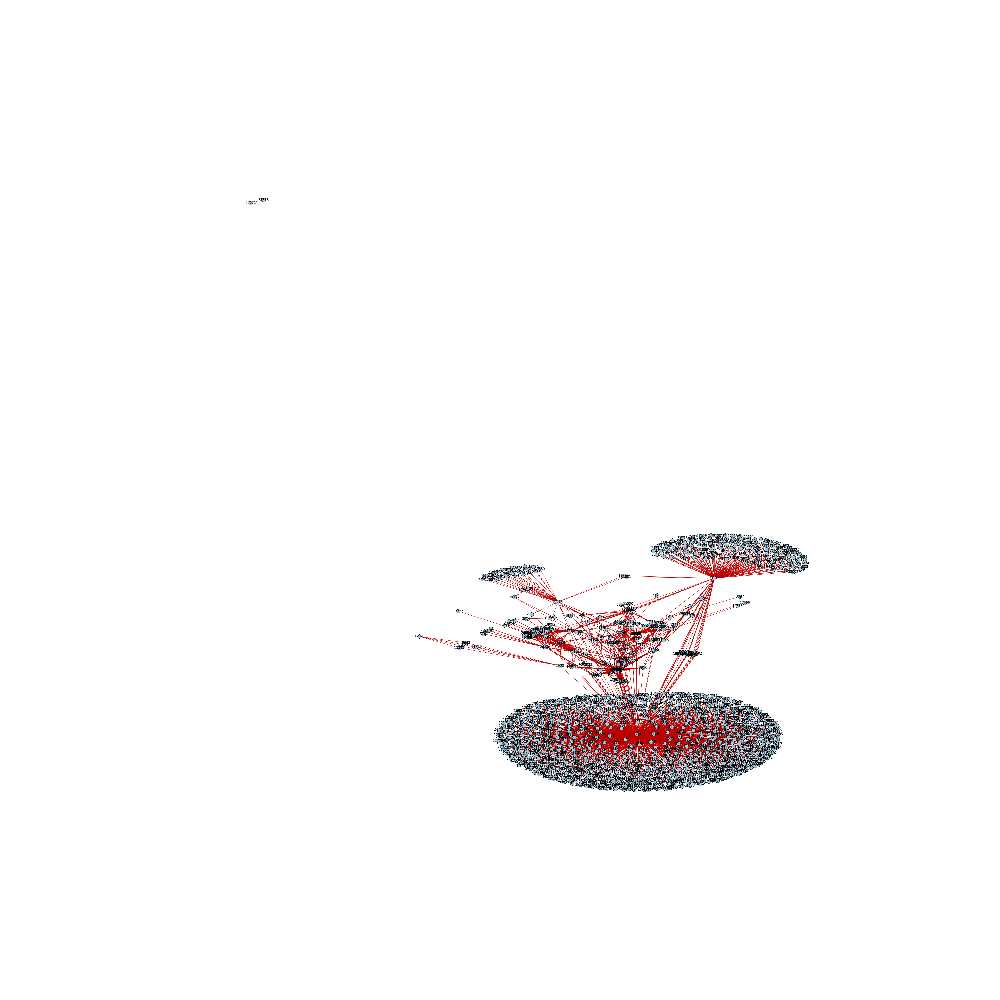

In [10]:
# Grapth for data after 2015

edges = []
for i in range(1, 2):
  edges.append(spark.sql("SELECT id1, id2 FROM category_co_accusals_limit where EXTRACT(YEAR from incident_date) >=" + str(2015)).toPandas())
  G = nx.from_pandas_edgelist(edges[-1], 'id1', 'id2')
  pos = nx.spring_layout(G)
  fig, ax = plt.subplots(figsize=(50, 50))
  nx.draw(G,pos,node_color='#A0CBE2', node_size = 200, edge_color='#BB0000', width=1, edge_cmap=plt.cm.Blues, with_labels=True)
  display(fig)
  time.sleep(5)

In [11]:
# Page rank for data after 2015

from graphframes import *
from pyspark.sql.functions import *

vertices = spark.sql("""
SELECT id1 as id
FROM category_co_accusals_limit
WHERE EXTRACT(YEAR from incident_date) >= 2015
GROUP BY id1 
""")

edges = spark.sql("SELECT id1 as src, id2 as dst FROM category_co_accusals_limit WHERE EXTRACT(YEAR from incident_date) < 2015")

g_after_2015 = GraphFrame(vertices, edges)


In [12]:
# Perform pagerank and get the results
results_after_2015 = g_after_2015.pageRank(resetProbability=0.15, tol=0.01)
print(results_after_2015)

GraphFrame(v:[id: int, pagerank: double], e:[src: int, dst: int ... 1 more field])

In [13]:
# Now, sort the results 
sorted_results = results_after_2015.vertices.sort('pagerank', ascending=False)
display(sorted_results)

id,pagerank
9309,32.712277375060715
32284,26.230651740242664
32255,20.412821485263535
32047,1.4186167355308392
25177,1.4186167355308392
11365,1.402220193306242
24877,1.402220193306242
13996,1.354164289155724
24426,1.344179508822086
3616,1.344179508822086


In [14]:
# Convert the results to sql view 
sorted_results.createOrReplaceTempView("sortedTableA2015")

# Combine the officers info with  (identified by pagerank)
df_pagerank = spark.sql('SELECT data_officer.id, gender, race, rank, birth_year, first_name, last_name, pagerank from data_officer INNER JOIN sortedTableA2015 ON sortedTableA2015.id = data_officer.id ').toPandas().sort_values(by=['pagerank'], ascending=False)

print(df_pagerank)


id gender race rank birth_year first_name \
29 9309 M White Sergeant 1967 Lawrence 
9 32284 M White Police Officer 1967 Mark 
106 32255 M Hispanic Police Officer 1970 Gerardo 
100 25177 M Hispanic Police Officer 1973 Luis 
8 32047 M Black Police Officer 1966 Charles 
94 24877 M White Police Officer 1954 Ronald 
96 11365 M White Police Officer 1966 Brian 
47 13996 M White Police Officer 1977 Nick 
73 3616 M White Police Officer 1967 Patrick 
19 24426 M Hispanic Police Officer 1972 Jesse 
101 11855 M Black Police Officer 1967 Horst 
93 25416 M Hispanic Police Officer 1969 Juan 
11 6254 M White Sergeant 1972 Thomas 
13 32125 M White Police Officer 1978 Brian 
35 29844 M Black Sergeant 1974 Robert 
7 7242 M White Sergeant 1969 Edward 
18 20453 M White Police Officer 1983 Jonathan 
44 18092 M White Police Officer 1968 Bernard 
42 15632 M Black Sergeant 1978 Craig 
78 8926 M White Police Officer 1968 Brian 
75 24851 F White Detective 1967 Susan 
76 16951 M White Police Officer 1984 Sebastian 
61 32203 M Hispanic Police Officer 1963 David 
51 13940 M Black Police Officer 1980 Cory 
33 4118 M White Lieutenant 1967 James 
48 1747 M Hispanic Police Officer 1978 Juan 
103 521 M White Detective 1978 Michael 
22 29069 M Black Police Officer 1978 Vincent 
43 16891 M White Police Officer 1965 John 
65 20733 M White Police Officer 1977 Jason 
.. ... ... ... ... ... ... 
30 6781 M White Sergeant 1977 James 
67 8657 M Black Police Officer 1977 Elliot 
66 1214 M Asian/Pacific Police Officer 1982 Elmer 
91 25071 M White Police Officer 1984 Wayne 
105 10420 M White Police Officer 1973 Mark 
28 17830 M White Police Officer 1966 Michael 
87 3191 M White Police Officer 1976 Michael 
107 19418 M Black Police Officer 1952 Edward 
59 13333 M White Police Officer 1986 Mateusz 
15 26986 F Hispanic Police Officer 1983 Stefany 
70 11816 M Black Police Officer 1967 David 
83 10588 M White Police Officer 1971 Daniel 
5 22839 F Hispanic Police Officer 1980 Shylah 
69 13069 M Black Police Officer 1967 Christoph 
40 18599 M White Sergeant 1973 Andrew 
74 15032 M White Police Officer 1959 Dean 
52 12303 M White Police Officer 1989 Sean 
92 28321 M Black Detective 1968 Christoph 
60 1872 M White Sergeant 1970 William 
104 2643 M White Police Officer 1969 Glenn 
54 13348 M Black Police Officer 1984 Shaun 
72 29085 M White Police Officer 1958 Michael 
37 17335 M White Police Officer 1969 Ronald 
58 19803 M Asian/Pacific Police Officer 1972 Andy 
41 25511 M White Police Officer 1980 Derek 
64 14969 M White Police Officer 1976 Daniel 
34 14799 M White Police Officer 1973 Serguey 
102 26145 M White Detective 1983 Erik 
26 32057 M White Police Officer 1972 Ricky 
88 6666 M Hispanic Police Officer 1983 Jesus 

 last_name pagerank 
29 Gade 32.712277 
9 Reno 26.230652 
106 Perez 20.412821 
100 Saldana 1.418617 
8 Honore 1.418617 
94 Rufo 1.402220 
96 Hansen 1.402220 
47 Kakos 1.354164 
73 Cain 1.344180 
19 Rodriguez 1.344180 
101 Hegewald 1.224366 
93 Santiago 1.216653 
11 Davey 1.072577 
13 Leahy 1.062068 
35 Walker 1.022870 
7 Dougherty 0.982905 
18 Newsome 0.975548 
44 Mc Devitt 0.975548 
42 Landrum 0.975548 
78 Ford 0.975548 
75 Ruck 0.959151 
76 Magiera 0.959151 
61 Morales 0.805935 
51 Junious 0.805935 
33 Cascone 0.805935 
48 Belmontes 0.805935 
103 Amato 0.789538 
22 Turner 0.789538 
43 Maclaren 0.789538 
65 Nunez 0.789538 
.. ... ... 
30 Desmond 0.346470 
67 Flagg 0.346470 
66 Banal 0.346470 
91 Rydberg 0.324796 
105 Gordon 0.304762 
28 Mayhew 0.295961 
87 Bubacz 0.295555 
107 Montgomery 0.295555 
59 Jasinski 0.295555 
15 Solis 0.295555 
70 Heard 0.295555 
83 Grannes 0.276031 
5 Porrata 0.276031 
69 Jackson 0.266203 
40 Mcglynn 0.262424 
74 Korbas 0.262424 
52 Hitz 0.262424 
92 Tenton 0.234511 
60 Bernath 0.231639 
104 Bragiel 0.231639 
54 Jaudon 0.231639 
72 Twarowski 0.230471 
37 Mariani 0.217851 
58 Moy 0.198031 
41 Saxton 0.196861 
64 Kolodziejski 0.196776 
34 Klemens 0.196194 
102 Shearer 0.176856 
26 Hughes 0.176856 
88 Delgado 0.176856 

[108 rows x 8 colum

In [15]:
from collections import Counter 
# Now, perform analysis on top 50 officers as per pagerank 
df_top50 = df_pagerank[:50]
races = df_top50['race']
most_common_races = Counter(races).most_common()
count_of_races = [c for r, c in most_common_races]
unique_races = [r for r, c in most_common_races]
print(Counter(races).most_common())



[('White', 29), ('Hispanic', 11), ('Black', 10)]

In [16]:
from collections import Counter 
# Now, perform analysis on top 50 officers as per pagerank 
df_top50 = df_pagerank[:50]
races = df_top50['race']
most_common_races = Counter(races).most_common()
count_of_races = [c for r, c in most_common_races]
unique_races = [r for r, c in most_common_races]
print(Counter(races).most_common())

[('White', 29), ('Hispanic', 11), ('Black', 10)]

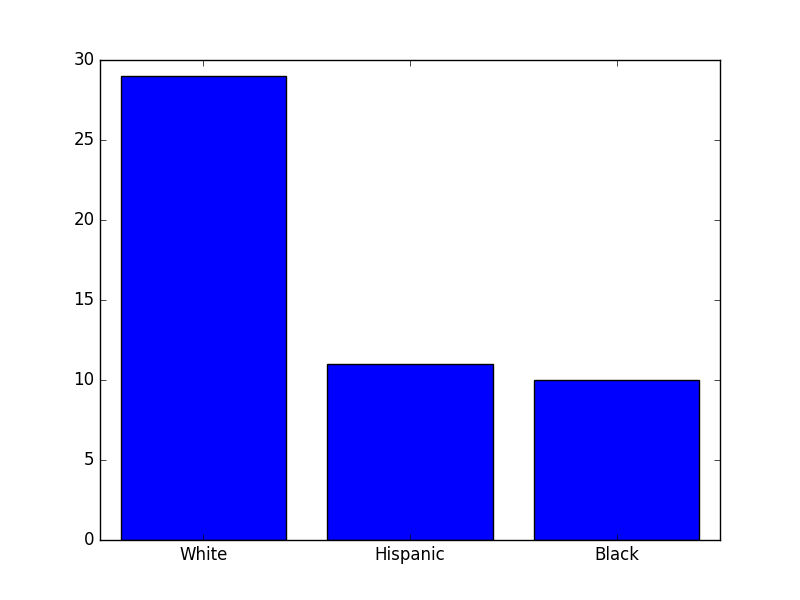

In [17]:
# Display the races in form of bar plot 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_races))
plt.bar(x, count_of_races, align='center')
plt.xticks(x, unique_races)
# axes.set_xticklabels(unique_races)
display(fig)

In [18]:
# Now, let's do it for rank 
ranks = df_top50['rank']
most_common_ranks = Counter(ranks).most_common()
count_of_ranks = [c for r, c in most_common_ranks]
unique_ranks = [r for r, c in most_common_ranks]
print(Counter(ranks).most_common())

[('Police Officer', 39), ('Sergeant', 6), ('Detective', 3), ('Lieutenant', 2)]

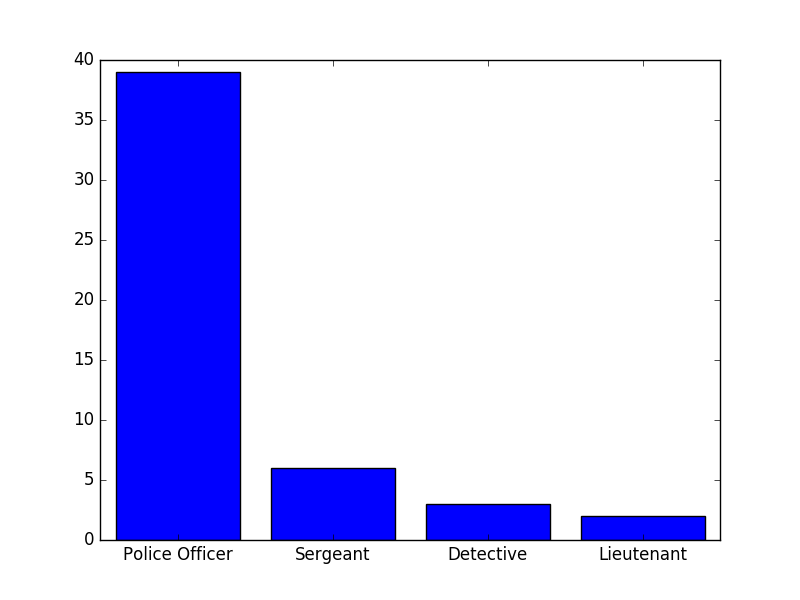

In [19]:
# Display the ranks 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_ranks))
plt.bar(x, count_of_ranks, align='center')
plt.xticks(x, unique_ranks)
# axes.set_xticklabels(unique_races)
display(fig)

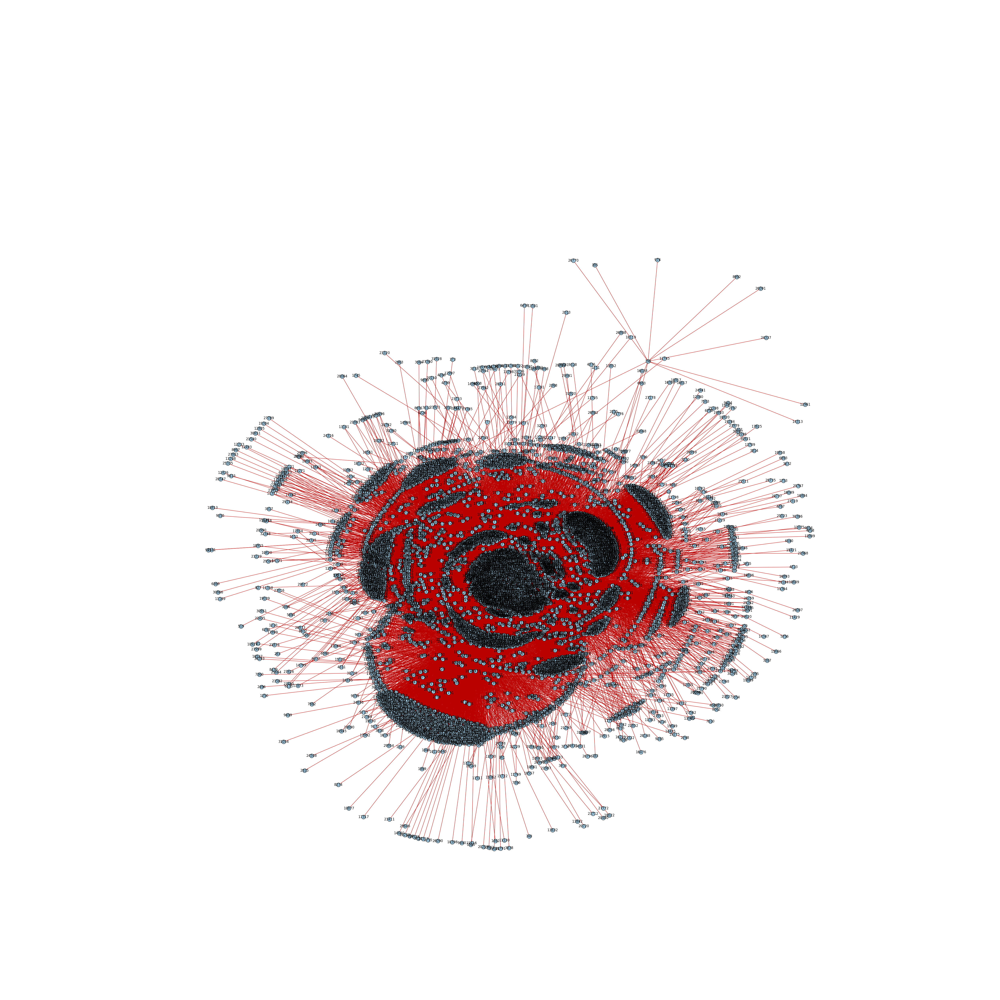

In [20]:
# Grapth for data before 2015

edges = []
for i in range(1, 2):
  edges.append(spark.sql("SELECT id1, id2 FROM category_co_accusals_limit where EXTRACT(YEAR from incident_date) <" + str(2015)).toPandas())
  G = nx.from_pandas_edgelist(edges[-1], 'id1', 'id2')
  pos = nx.spring_layout(G, k = 0.1)
  fig, ax = plt.subplots(figsize=(50, 50))
  nx.draw(G,pos,node_color='#A0CBE2', node_size = 200, edge_color='#BB0000', width=1, edge_cmap=plt.cm.Blues, with_labels=True)
  display(fig)
  time.sleep(5)

In [21]:
# Page rank for data before 2015

from graphframes import *
from pyspark.sql.functions import *

vertices = spark.sql("""
SELECT id1 as id
FROM category_co_accusals_limit
WHERE EXTRACT(YEAR from incident_date) < 2015
GROUP BY id1 
""")

edges = spark.sql("SELECT id1 as src, id2 as dst FROM category_co_accusals_limit WHERE EXTRACT(YEAR from incident_date) < 2015")

g_before_2015 = GraphFrame(vertices, edges)


In [22]:
# Perform pagerank and get the results
results_before_2015 = g_before_2015.pageRank(resetProbability=0.15, tol=0.01)
print(results_before_2015)

GraphFrame(v:[id: int, pagerank: double], e:[src: int, dst: int ... 1 more field])

In [23]:
# Now, sort the results 
sorted_results = results_before_2015.vertices.sort('pagerank', ascending=False)
display(sorted_results)

id,pagerank
32265,65.93410388994873
650,64.8004288155294
31910,61.51040185851257
12220,59.69899957980247
32166,58.53147240982364
10890,57.70640069407308
3950,56.97350379081388
17816,55.21814624335588
28378,54.87201726575869
31422,53.42692202885659


In [24]:
# Convert the results to sql view 
sorted_results.createOrReplaceTempView("sortedTableB2015")


In [25]:
# Combine the officers info with  (identified by pagerank)
df_pagerank = spark.sql('SELECT data_officer.id, gender, race, rank, birth_year, first_name, last_name, pagerank from data_officer INNER JOIN sortedTableB2015 ON sortedTableB2015.id = data_officer.id ').toPandas().sort_values(by=['pagerank'], ascending=False)

print(df_pagerank)

id gender race rank birth_year first_name \
3443 32265 M White Detective 1972 Raymond 
1640 650 M Black Police Officer 1965 Maurice 
3223 31910 M Hispanic Police Officer 1972 Daniel 
4199 12220 M Black Police Officer 1970 Courtney 
1428 32166 M Black Sergeant 1964 Emmett 
4670 10890 M Black Police Officer 1950 James 
4514 3950 M White Police Officer 1945 John 
3350 17816 M White Police Officer 1951 Edward 
3638 28378 M White Detective 1973 Patrick 
982 31422 M White Police Officer 1963 Daniel 
1163 25306 M Hispanic Commander 1960 James 
1818 23205 M Black Sergeant 1969 Tracy 
1358 8578 M White Police Officer 1948 Richard 
4221 11634 M White Detective 1965 Frederick 
1641 2375 M White Sergeant 1956 Marvin 
3656 17372 M White Police Officer 1963 Nenad 
1206 8562 M White Police Officer 1963 Jerome 
2182 25373 M Hispanic Field Training Officer 1956 Juan 
1239 5193 M White Police Officer 1973 Michael 
576 1056 M Hispanic Police Officer 1962 Ronald 
2448 2356 M White Police Officer 1954 Harold 
2355 31882 M Black Police Officer 1970 Ronald 
2101 25898 M Black Police Officer 1953 Robert 
2220 13095 M Black Sergeant 1966 Gregory 
1226 29841 M Black Sergeant 1951 Tommy 
645 17285 M White Police Officer 1958 Edward 
2993 28740 M Hispanic Police Officer 1959 Ignacio 
1014 3956 M Hispanic Police Officer 1957 Bill 
95 2096 M Black Police Officer 1950 Robert 
1318 9309 M White Sergeant 1967 Lawrence 
... ... ... ... ... ... ... 
2413 6285 M Black Detective 1970 William 
790 15638 M White Sergeant 1967 Frederick 
833 31920 M White Police Officer 1969 Marco 
1644 9953 M Black Detective 1969 Darryl 
3756 10661 F Black Detective 1948 Cheryl 
2237 263 F Hispanic Police Officer 1968 Elizabeth 
817 17101 M White Sergeant 1971 Michael 
702 23229 M White Police Officer 1967 Patrick 
58 16534 M Hispanic Police Officer 1950 Concepcio 
4095 16945 M Hispanic Sergeant 1975 Rafael 
4123 28451 M White Police Officer 1981 Brian 
3604 20990 M White Detective 1948 Robert 
2646 1989 M White Police Officer 1978 Joshua 
3002 4008 M Hispanic Police Officer 1951 Felix 
5006 11229 M White Police Officer 1961 Timothy 
545 25023 M White Police Officer 1956 Kevin 
2729 27178 M White Police Officer 1943 George 
2222 14996 M White Police Officer 1976 Brian 
4788 31360 F Black Police Officer 1953 Sandra 
1103 17276 M White Police Officer 1946 Joseph 
1290 8226 M White Police Officer 1954 Timothy 
2244 6540 M Black Police Officer 1972 Marc 
4794 1948 M White Police Officer 1949 Lawrence 
3835 21987 M Black Police Officer 1972 Derrick 
1923 23923 M White Detective 1948 Charles 
3670 4723 M White Lieutenant 1959 Thomas 
4420 10609 M White Sergeant 1968 William 
4718 15421 M White Police Officer 1978 Arif 
984 31962 M White Police Officer 1977 Peter 
815 16476 M White Detective 1951 Jody 

 last_name pagerank 
3443 Piwnicki 65.934104 
1640 Anderson 64.800429 
3223 De Lopez 61.510402 
4199 Hill 59.699000 
1428 Mc Clendon 58.531472 
4670 Grubbs 57.706401 
4514 Carney 56.973504 
3350 May 55.218146 
3638 Thelen 54.872017 
982 Young 53.426922 
1163 Sanchez 52.698737 
1818 Quarles 51.961817 
1358 Fiorito 51.515047 
4221 Hasenfang 48.904672 
1641 Bonnstetter 48.181521 
3656 Markovich 47.532965 
1206 Finnigan 47.517390 
2182 Sandoval 46.287638 
1239 Connolly 46.238484 
576 Baez 45.559452 
2448 Bone 40.149143 
2355 Coleman 39.547831 
2101 Seaberry 39.185050 
2220 Jackson 35.228649 
1226 Walker 34.813949 
645 Maras 34.029314 
2993 Torres 33.390754 
1014 Caro 33.174040 
95 Blackman 32.944875 
1318 Gade 32.696611 
... ... ... 
2413 Davis 0.195512 
790 Lane 0.195512 
833 Di Franco 0.195512 
1644 Gilbert 0.195512 
3756 Green 0.195512 
2237 Alaniz 0.195512 
817 Malinowski 0.195512 
702 Quinn 0.195512 
58 Lopez 0.195512 
4095 Magallon 0.195512 
4123 Thomas 0.195512 
3604 O Loughlin 0.195512 
2646 Bielema 0.195512 
3002 Carrizales 0.195512 
5006 Halloran 0.195512 
545 Ryan 0.176772 
2729 Sperekas 0.176772 
2222 Konior 0.176772 
4788 Yancey 0.176772 
1103 Mara 0.176772 
1290 Fallon 0.176772 


In [26]:
from collections import Counter 
# Now, perform analysis on top 50 officers as per pagerank 
df_top50 = df_pagerank[:50]
races = df_top50['race']
most_common_races = Counter(races).most_common()
count_of_races = [c for r, c in most_common_races]
unique_races = [r for r, c in most_common_races]
print(Counter(races).most_common())



[('White', 23), ('Black', 17), ('Hispanic', 9), ('Asian/Pacific', 1)]

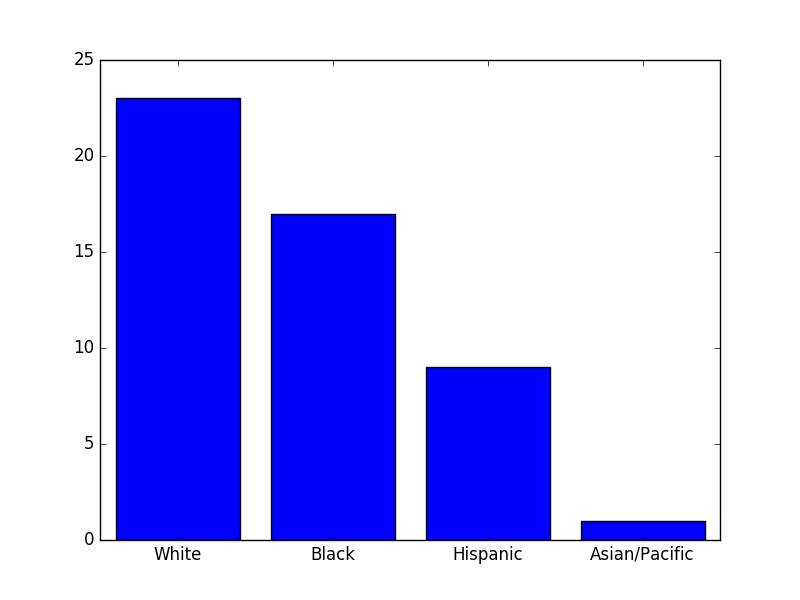

In [27]:
# Display the races in form of bar plot 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_races))
plt.bar(x, count_of_races, align='center')
plt.xticks(x, unique_races)
# axes.set_xticklabels(unique_races)
display(fig)

In [28]:
# Now, let's do it for rank 
ranks = df_top50['rank']
most_common_ranks = Counter(ranks).most_common()
count_of_ranks = [c for r, c in most_common_ranks]
unique_ranks = [r for r, c in most_common_ranks]
print(Counter(ranks).most_common())


[('Police Officer', 32), ('Sergeant', 11), ('Detective', 4), ('Field Training Officer', 2), ('Commander', 1)]

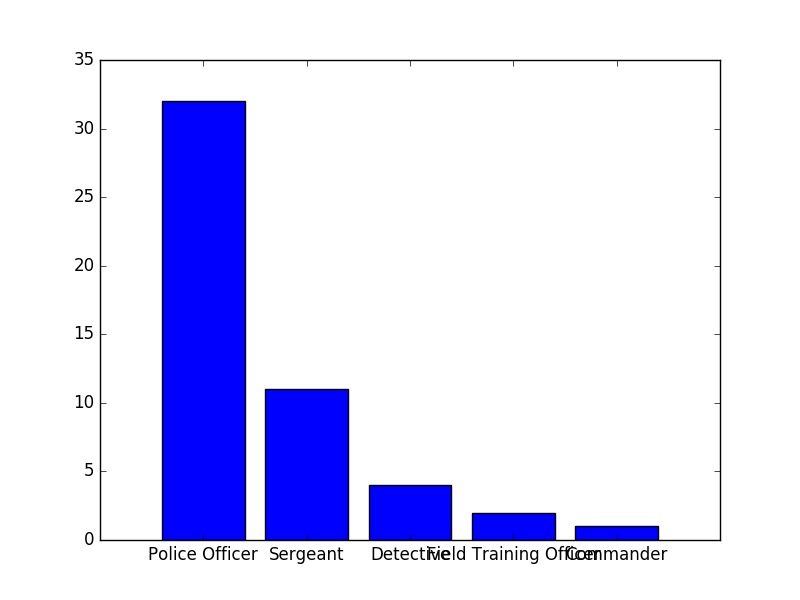

In [29]:
# Display the ranks 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_ranks))
plt.bar(x, count_of_ranks, align='center')
plt.xticks(x, unique_ranks)
# axes.set_xticklabels(unique_races)
display(fig)